In [ ]:
!pip install python-igraph matplotlib scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 14.2 MB/s eta 0:00:00


In [ ]:
#!pip install pycairo
!pip install cairocffi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.1/75.1 kB 2.5 MB/s eta 0:00:00


In [ ]:
import igraph as ig
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress

In [ ]:
# For pycairo
#import cairo

# For cairocffi
import cairocffi


In [ ]:
n = 1000
m = 1
pa_1000 = ig.Graph.Barabasi(n=n, m=m, directed=False)
print(pa_1000.is_connected())

True


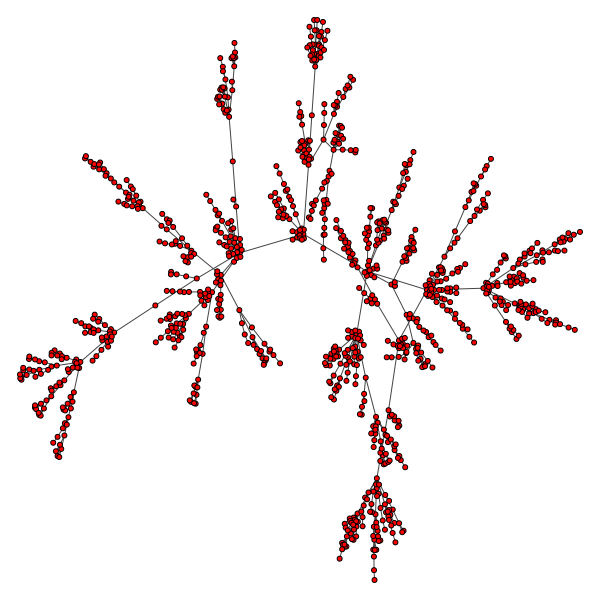

In [ ]:
ig.plot(pa_1000, "1_2_a.eps", vertex_size=5, vertex_label=None)

In [ ]:
pa_com = pa_1000.community_fastgreedy().as_clustering()
pa_mod = pa_com.modularity
print("Modularity:", pa_mod)

Modularity: 0.9350130911692475


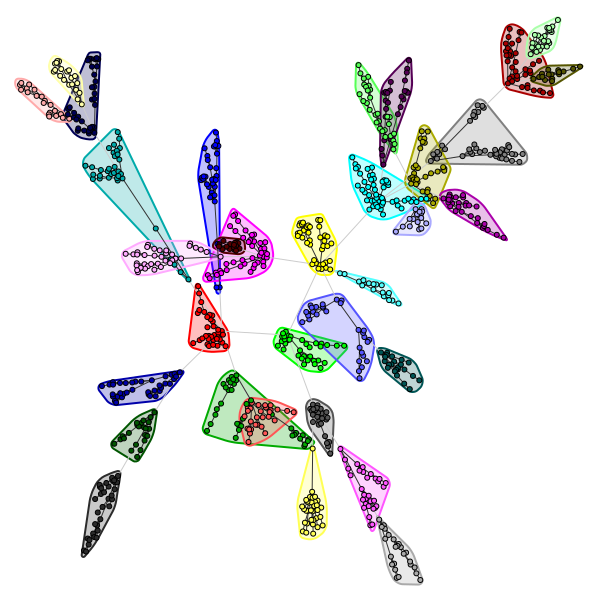

In [ ]:
ig.plot(pa_com, "1_2_b.eps", mark_groups=True, vertex_size=5, vertex_label=None)

In [ ]:
pa_10000 = ig.Graph.Barabasi(n=10000, m=m, directed=False)
print(pa_10000.is_connected())
ig.plot(pa_10000, "1_2_c1.eps", vertex_size=4, vertex_label=None)

True


In [ ]:
pa_com2 = pa_10000.community_fastgreedy().as_clustering()
pa_mod2 = pa_com2.modularity
print("Modularity:", pa_mod2)
ig.plot(pa_com2, "1_2_c2.eps", mark_groups=True, vertex_size=3, vertex_label=None)

Modularity: 0.9786790310194141


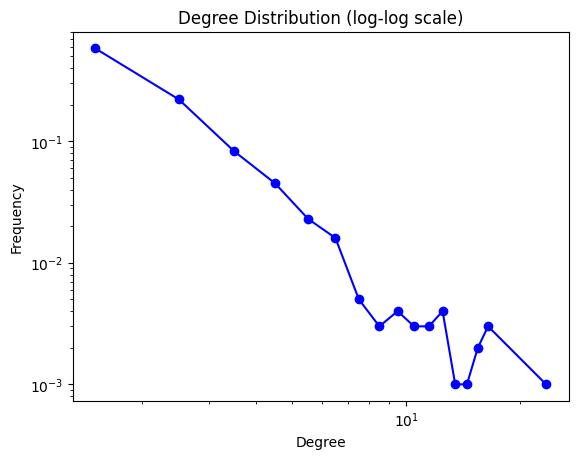

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming pa_1000 is your graph object from igraph
degrees = np.array(pa_1000.degree())  # Get the degree of each node in the graph
max_degree = np.max(degrees)  # Find the maximum degree to set bins
degree_counts, bin_edges = np.histogram(degrees, bins=range(0, max_degree + 2), density=True)  # Histogram of degrees

# To ensure we're working with non-zero frequencies for the log-log plot
non_zero_indices = degree_counts > 0
degree_counts = degree_counts[non_zero_indices]
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Calculate bin centers
bin_centers = bin_centers[non_zero_indices]

# Plotting
plt.figure()
plt.loglog(bin_centers, degree_counts, 'b-', marker='o')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution (log-log scale)')
plt.show()


In [ ]:
degree_dist = degree_counts
valid_indices = degree_dist > 0
log_degrees = np.log(np.arange(1, len(degree_dist) + 1)[valid_indices])
log_freq = np.log(degree_dist[valid_indices])

Slope: -2.351450192090426, Intercept: -0.19285212867510548


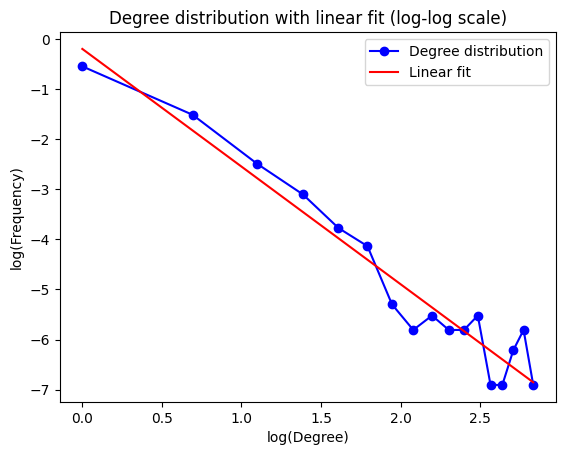

In [ ]:
slope, intercept, r_value, p_value, std_err = linregress(log_degrees, log_freq)
print(f"Slope: {slope}, Intercept: {intercept}")

# Plotting regression line
plt.figure()
plt.plot(log_degrees, log_freq, 'b-', marker='o', label='Degree distribution')
plt.plot(log_degrees, intercept + slope*log_degrees, 'r-', label='Linear fit')
plt.xlabel('log(Degree)')
plt.ylabel('log(Frequency)')
plt.legend()
plt.title('Degree distribution with linear fit (log-log scale)')
plt.savefig("degree_distribution_fit.eps")

In [ ]:


# Generate a scale-free network using Barabasi-Albert model
n = 1000  # Number of nodes
m = 1  # Number of edges to attach from a new node to existing nodes
g1 = ig.Graph.Barabasi(n, m, directed=False)

# Check if the network is connected
print(g1.is_connected())

# Similarly, generate g2 for 10,000 nodes
g2 = ig.Graph.Barabasi(10000, m, directed=False)


True


In [ ]:
def plot_degree_distribution(graph, title, filename):
    degrees = np.array(graph.degree())
    degree_counts, bin_edges = np.histogram(degrees, bins=np.arange(0, np.max(degrees)+1), density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    valid = degree_counts > 0
    log_degrees = np.log(bin_centers[valid])
    log_counts = np.log(degree_counts[valid])

    # Plotting
    plt.figure()
    plt.loglog(bin_centers[valid], degree_counts[valid], marker='o', linestyle='None')
    plt.title(title)
    plt.xlabel('Degree')
    plt.ylabel('Normalized Frequency')
    plt.savefig(filename)
    plt.close()

    # Linear regression on the log-log scale
    slope, intercept, r_value, p_value, std_err = linregress(log_degrees, log_counts)
    print(f"Linear regression results for {title}: slope={slope}, intercept={intercept}, p-value={p_value}")

plot_degree_distribution(g1, "Degree Distribution for G1", "1_2_d1.eps")
plot_degree_distribution(g2, "Degree Distribution for G2", "1_2_d2.eps")


Linear regression results for Degree Distribution for G1: slope=-2.2248916152099008, intercept=0.06050813582056591, p-value=6.293809352563639e-11
Linear regression results for Degree Distribution for G2: slope=-2.6493063290197036, intercept=0.38723422834780497, p-value=3.088911092524791e-20


## Design

In [ ]:
import numpy as np
import networkx as nx
from scipy.stats import norm, bernoulli

In [ ]:
n = 2000  # Number of nodes

# Random Geometric Graph (RGG)
radius_rgg = np.sqrt(5 / (np.pi * n))
coords = np.random.uniform(0, 1, (n, 2))
rgg_graph = nx.random_geometric_graph(n, radius_rgg, pos=dict(enumerate(coords)))

# Erdős-Rényi (ER) graph
p_er = 5 / n
er_graph = nx.erdos_renyi_graph(n, p_er)

In [ ]:
epsilon = norm.rvs(size=n)  # ε ~ N(0,1)
nu = norm.rvs(size=n)  # ν ~ N(0,1)
X = np.random.choice([0, 0.25, 0.5, 0.75, 1], size=n)  # X ~ U({0, 0.25, 0.5, 0.75, 1})/

In [ ]:
alpha, beta, delta, gamma = 0.5, 0.8, 10, -1  # Given parameters
import numpy as np
import networkx as nx

def V(graph, W, alpha, beta, delta, gamma, nu):
    A = nx.adjacency_matrix(graph)  # Adjacency matrix of the graph
    D = np.array(A.sum(axis=1)).flatten()  # Degree of each node, flattened to a 1-D array
    AW = A.dot(W)
    AX = A.dot(X)
    AV = A.dot(nu)
    V = (alpha +
         beta * np.divide(AW, D, out=np.zeros_like(AW), where=D!=0) +
         delta * np.divide(AX, D, out=np.zeros_like(AX), where=D!=0) +
         gamma * X +
         nu +
         np.divide(AV, D, out=np.zeros_like(AV), where=D!=0))
    return V  # Return as a 1-D array

V_values = V(rgg_graph, W, alpha, beta, delta, gamma, nu)

In [ ]:
Y = V_values  # According to the model, Y = V(Y, ε; β)


alpha_d, beta_d, delta_d, gamma_d = -0.5, 1.5, 1, -1  # Parameters for D
D = np.array([1 if v > 0 else 0 for v in V(rgg_graph, W, alpha_d, beta_d, delta_d, gamma_d, nu)])

In [ ]:
#  calculate the average path length
if nx.is_connected(rgg_graph):
    avg_path_length_rgg = nx.average_shortest_path_length(rgg_graph)
else:
    # largest connected component in the RGG graph
    largest_cc_rgg = max(nx.connected_components(rgg_graph), key=len)
    subgraph_rgg = rgg_graph.subgraph(largest_cc_rgg)
    avg_path_length_rgg = nx.average_shortest_path_length(subgraph_rgg)

if nx.is_connected(er_graph):
    avg_path_length_er = nx.average_shortest_path_length(er_graph)
else:
    # largest connected component in the ER graph
    largest_cc_er = max(nx.connected_components(er_graph), key=len)
    subgraph_er = er_graph.subgraph(largest_cc_er)
    avg_path_length_er = nx.average_shortest_path_length(subgraph_er)

print("Average path length in RGG's largest connected component:", avg_path_length_rgg)
print("Average path length in ER's largest connected component:", avg_path_length_er)


Average path length in RGG's largest connected component: 34.85345069460825
Average path length in ER's largest connected component: 4.909688423021196


In [ ]:
alpha_y, beta_y, delta_y, gamma_y = 0.5, 0.8, 10, -1


alpha_d, beta_d, delta_d, gamma_d = -0.5, 1.5, 1, -1

def calculate_V(graph, W, X, nu, alpha, beta, delta, gamma):
    A = nx.adjacency_matrix(graph)
    D = np.array(A.sum(axis=1)).flatten()
    V = alpha + (beta * (A.dot(W) / D)) + (delta * (A.dot(X) / D)) + (gamma * X) + nu + (A.dot(nu) / D)
    return np.nan_to_num(V)  # Replace NaN values with zero



In [ ]:
W_Y = np.random.normal(0, 1, n)  # Random normal vector W for Y
V_Y = calculate_V(rgg_graph, W_Y, X, epsilon, alpha_y, beta_y, delta_y, gamma_y)
Y = V_Y

<ipython-input-29-42016f97bd8e>:9: RuntimeWarning: invalid value encountered in divide
  V = alpha + (beta * (A.dot(W) / D)) + (delta * (A.dot(X) / D)) + (gamma * X) + nu + (A.dot(nu) / D)


In [ ]:
W_D = np.random.normal(0, 1, n)  # Random normal vector W for D
V_D = calculate_V(rgg_graph, W_D, X, nu, alpha_d, beta_d, delta_d, gamma_d)
D = (V_D > 0).astype(int)


<ipython-input-29-42016f97bd8e>:9: RuntimeWarning: invalid value encountered in divide
  V = alpha + (beta * (A.dot(W) / D)) + (delta * (A.dot(X) / D)) + (gamma * X) + nu + (A.dot(nu) / D)


In [ ]:

def calculate_error_term(graph, nu):
    A = nx.adjacency_matrix(graph)
    sum_A_nu = A.dot(nu)
    degrees = np.array(A.sum(axis=1)).flatten()

    error_term = nu + np.divide(sum_A_nu, degrees, where=degrees!=0)
    return np.nan_to_num(error_term)  # Replace NaN values with zero


nu_error_term = calculate_error_term(rgg_graph, nu)

# Treatment selection mechanism

def treatment_selection(V, threshold=0):
    return (V > threshold).astype(int)

D_simulated = treatment_selection(V_D + nu_error_term)


In [ ]:
D_simulated

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
df = pd.DataFrame(D_simulated, column='values')
df[['values']<1]